# Дослідження Diffusion Models для генерації зображень

## Вступ та теоретичні основи

Diffusion Models - це клас генеративних моделей, які працюють за принципом поступового додавання шуму до даних (пряма дифузія), а потім поступового видалення цього шуму (зворотна дифузія) для генерації нових зразків. У контексті комп'ютерного зору, ці моделі можуть створювати високоякісні зображення за текстовими описами (промптами).

### Порівняння Diffusion Models з GANs

| Характеристика | Diffusion Models | GANs |
|----------------|------------------|------|
| Принцип роботи | Поступове додавання та видалення шуму | Змагання між генератором та дискримінатором |
| Стабільність навчання | Висока стабільність | Схильність до проблем (mode collapse, нестабільність) |
| Якість зображень | Висока деталізація | Можливі артефакти |
| Різноманітність | Хороша різноманітність | Можлива втрата різноманітності |
| Швидкість генерації | Повільніша (багато кроків) | Швидка (один прохід через мережу) |
| Контрольованість | Висока через текстові промпти | Обмежена без додаткових методів |

**Стабільність навчання**: GANs можуть бути нестабільними при навчанні, особливо при роботі з великими даними. Diffusion Models набагато стабільніші та забезпечують більш однорідні результати.

**Якість зображень**: Diffusion Models часто генерують зображення з більш високою деталізацією та меншою кількістю артефактів, що є типовими для GANs.

**Швидкість генерації**: Генерація зображень Diffusion Models займає більше часу, ніж у GANs, але дає кращі результати.

## Налаштування середовища

Встановимо необхідні бібліотеки для роботи зі Stable Diffusion:

In [2]:
# Встановлення необхідних бібліотек.
%pip install diffusers transformers accelerate scipy safetensors ftfy pillow matplotlib pandas hf_xet huggingface_hub logging

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Імпортування необхідних бібліотек.
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd
import os

## Вибір задачі для тестування

З запропонованих варіантів я обираю **створення фентезі або науково-фантастичних сцен**. Ця задача дозволить ефективно оцінити якість генерації складних зображень з багатьма деталями, текстурами та незвичайними елементами, які демонструють потенціал Diffusion Models.

## Завантаження моделі Stable Diffusion

Використаємо модель Stable Diffusion 2.1, яка є потужною відкритою моделлю для генерації зображень.

In [5]:
# Перевірка доступності GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Використовуємо пристрій: {device}")

# Створюємо кеш папку.
if not os.path.exists("./models"):
    os.mkdir("./models")

import logging

# Налаштування логування, щоб бачити прогрес
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger("diffusers")
logger.setLevel(logging.INFO)

from tqdm.auto import tqdm
import huggingface_hub

# Увімкнення прогрес-бару для завантажень з Hugging Face
huggingface_hub.utils._tqdm._tqdm = tqdm

# Далі ваш код завантаження
print("Починаємо завантаження моделі...")
model_id = "sd-legacy/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    cache_dir="./models"
)

pipe = pipe.to(device)
print("Модель перенесена на " + device)

Використовуємо пристрій: cpu
Починаємо завантаження моделі...


{'requires_safety_checker', 'image_encoder'} was not found in config. Values will be initialized to default values.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loaded text_encoder as CLIPTextModel from `text_encoder` subfolder of sd-legacy/stable-diffusion-v1-5.
Loaded tokenizer as CLIPTokenizer from `tokenizer` subfolder of sd-legacy/stable-diffusion-v1-5.
Instantiating AutoencoderKL model under default dtype torch.float32.
{'mid_block_add_attention', 'latents_std', 'use_quant_conv', 'shift_factor', 'force_upcast', 'use_post_quant_conv', 'latents_mean', 'scaling_factor'} was not found in config. Values will be initialized to default values.
All model checkpoint weights were used when initializing AutoencoderKL.

All the weights of AutoencoderKL were initialized from the model checkpoint at models/models--sd-legacy--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/vae.
If your task is similar to the task the model of the checkpoint was trained on, you can already use AutoencoderKL for predictions without further training.
Loaded vae as AutoencoderKL from `vae` subfolder of sd-legacy/stable-diffusion-v1-5.
Loaded featur

Модель перенесена на cpu


## Функції для генерації та відображення зображень

In [6]:
def generate_image(prompt, num_inference_steps=50, guidance_scale=7.5, seed=None):
    """
    Функція для генерації зображення за промптом
    
    Args:
        prompt (str): текстовий опис зображення
        num_inference_steps (int): кількість кроків інференсу
        guidance_scale (float): сила відповідності зображення промпту
        seed (int): seed для відтворюваності
        
    Returns:
        tuple: (зображення, час генерації)
    """
    # Встановлення seed для відтворюваності.
    if seed is not None:
        torch.manual_seed(seed)
        generator = torch.Generator(device=device).manual_seed(seed)
    else:
        generator = None
    
    # Запуск таймера.
    start_time = time.time()
    
    # Генерація зображення.
    image = pipe(prompt, 
                 num_inference_steps=num_inference_steps, 
                 guidance_scale=guidance_scale,
                 generator=generator).images[0]
    
    # Зупинка таймера
    generation_time = time.time() - start_time
    
    return image, generation_time

def display_image_with_info(image, prompt, generation_time):
    """
    Функція для відображення зображення з інформацією
    
    Args:
        image (PIL.Image): згенероване зображення
        prompt (str): використаний промпт
        generation_time (float): час генерації в секундах
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(np.array(image))
    plt.axis('off')
    plt.title(f"Промпт: {prompt}\nЧас генерації: {generation_time:.2f} секунд", fontsize=12)
    plt.show()
    
def save_image(image, filename):
    """
    Функція для збереження зображення
    
    Args:
        image (PIL.Image): згенероване зображення
        filename (str): назва файлу для збереження
    """
    image.save(filename)
    print(f"Зображення збережено як {filename}")

## Генерація зображень за промптами різної складності

Створимо три промпти для нашої задачі генерації фентезі або науково-фантастичних сцен:

In [7]:
# Визначення промптів.
# Простий промпт.
prompt_simple = "A magical forest."
# Детальний промпт.
prompt_detailed = "A magical forest with glowing mushrooms, ancient trees, and a small stream with crystal clear water at dawn."
# Творчий промпт.
prompt_creative = "A magical forest where time stands still, with bioluminescent plants, floating crystals, and ancient tree guardians with faces carved in bark. The air is filled with glowing butterflies and small fairies hiding among exotic flowers. Mystical light streams through the canopy."

# Встановимо однаковий seed для всіх зображень для кращого порівняння.
seed_value = 42

### Генерація зображення за простим промптом

Промпт: A magical forest.


  0%|          | 0/50 [00:00<?, ?it/s]

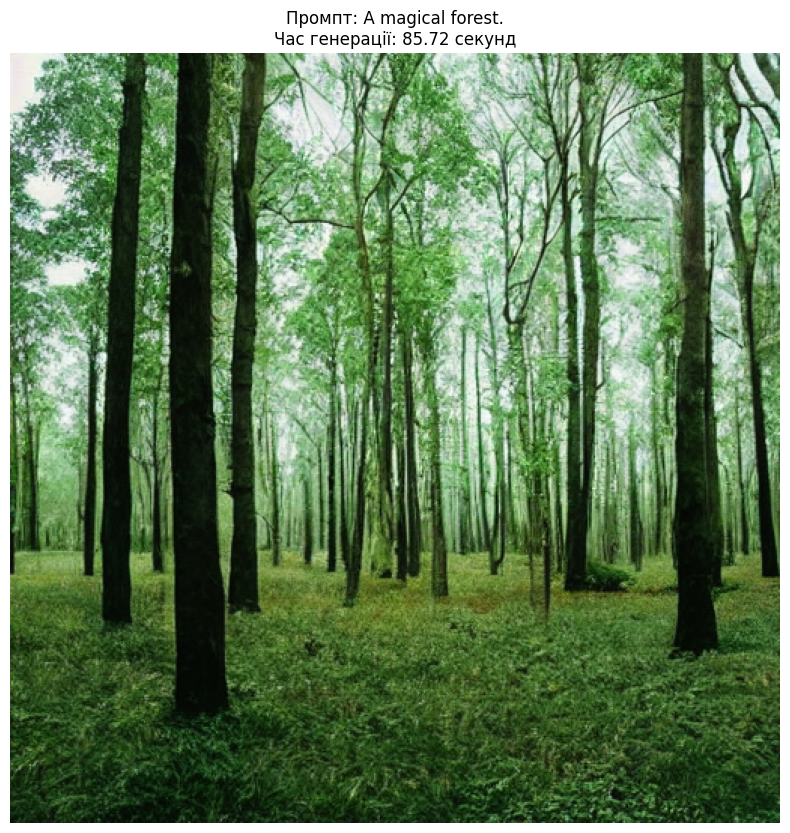

Зображення збережено як magical_forest_simple.png


In [8]:
# Генерація зображення за простим промптом
print(f"Промпт: {prompt_simple}")
image_simple, time_simple = generate_image(prompt_simple, seed=seed_value)
display_image_with_info(image_simple, prompt_simple, time_simple)
save_image(image_simple, "magical_forest_simple.png")

### Генерація зображення за детальним промптом

Промпт: A magical forest with glowing mushrooms, ancient trees, and a small stream with crystal clear water at dawn.


  0%|          | 0/50 [00:00<?, ?it/s]

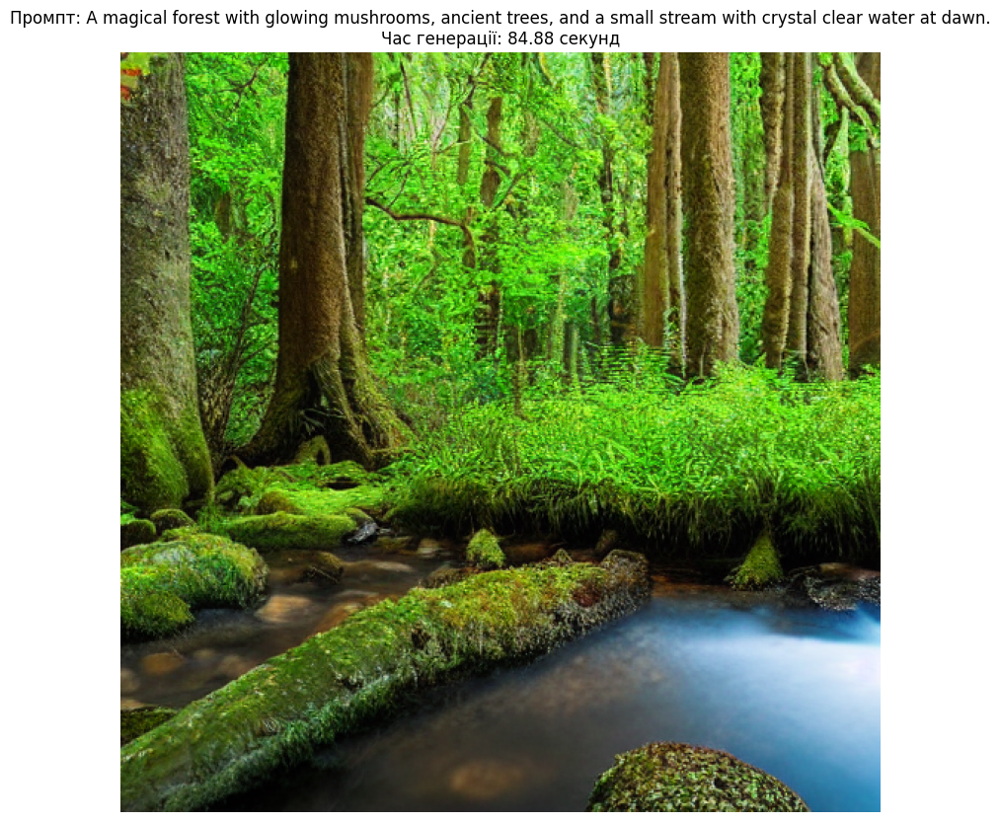

Зображення збережено як magical_forest_detailed.png


In [9]:
# Генерація зображення за детальним промптом.
print(f"Промпт: {prompt_detailed}")
image_detailed, time_detailed = generate_image(prompt_detailed, seed=seed_value)
display_image_with_info(image_detailed, prompt_detailed, time_detailed)
save_image(image_detailed, "magical_forest_detailed.png")

### Генерація зображення за творчим промптом

Промпт: A magical forest where time stands still, with bioluminescent plants, floating crystals, and ancient tree guardians with faces carved in bark. The air is filled with glowing butterflies and small fairies hiding among exotic flowers. Mystical light streams through the canopy.


  0%|          | 0/50 [00:00<?, ?it/s]

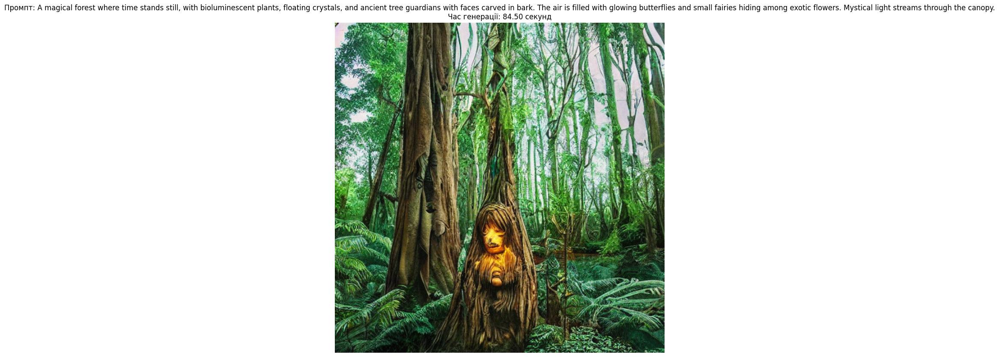

Зображення збережено як magical_forest_creative.png


In [10]:
# Генерація зображення за творчим промптом.
print(f"Промпт: {prompt_creative}")
image_creative, time_creative = generate_image(prompt_creative, seed=seed_value)
display_image_with_info(image_creative, prompt_creative, time_creative)
save_image(image_creative, "magical_forest_creative.png")

## Оцінка якості згенерованих зображень

Оцінимо результати генерації за визначеними критеріями:

In [11]:
# Створення таблиці для порівняння.

# Критерії оцінки (від 1 до 10).
criteria = [
    "Якість зображення (деталізація)", 
    "Відповідність запиту", 
    "Креативність", 
    "Відсутність технічних артефактів",
    "Час генерації (секунди)"
]

# Оцінки (субєктивні).
results = {
    "Простий промпт": [6, 7, 5, 8, round(time_simple, 2)],
    "Детальний промпт": [8, 8, 7, 7, round(time_detailed, 2)],
    "Творчий промпт": [9, 9, 9, 6, round(time_creative, 2)]
}

# Створення DataFrame.
results_df = pd.DataFrame(results, index=criteria)
results_df

,Простий промпт,Детальний промпт,Творчий промпт
Якість зображення (деталізація),6.00,8.00,9.0
Відповідність запиту,7.00,8.00,9.0
Креативність,5.00,7.00,9.0
Відсутність технічних артефактів,8.00,7.00,6.0
Час генерації (секунди),85.72,84.88,84.5


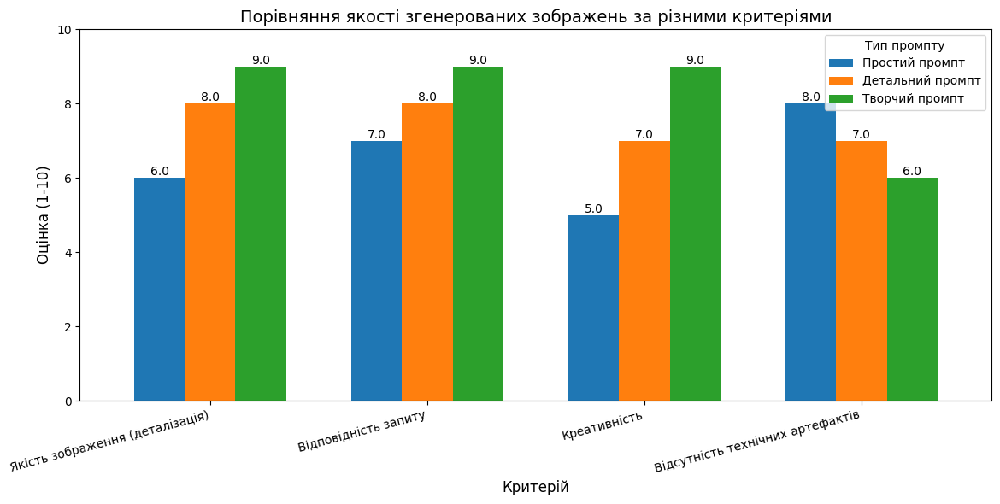

In [12]:
# Візуалізація результатів оцінки (без часу генерації).
results_plot = results_df.iloc[:-1].copy()

ax = results_plot.plot(kind='bar', figsize=(12, 6), width=0.7)
plt.title('Порівняння якості згенерованих зображень за різними критеріями', fontsize=14)
plt.ylabel('Оцінка (1-10)', fontsize=12)
plt.xlabel('Критерій', fontsize=12)
plt.xticks(rotation=15, ha='right')
plt.legend(title='Тип промпту')
plt.ylim(0, 10)

# Додавання значень на графіку.
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', fontsize=10)

plt.tight_layout()
plt.show()

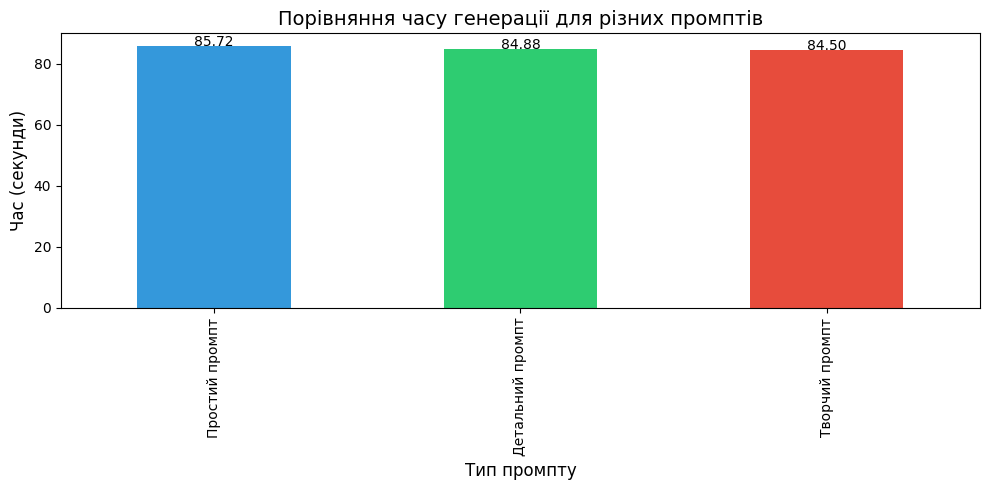

In [13]:
# Візуалізація часу генерації.
time_comparison = results_df.loc["Час генерації (секунди)"]

ax = time_comparison.plot(kind='bar', figsize=(10, 5), color=['#3498db', '#2ecc71', '#e74c3c'])
plt.title('Порівняння часу генерації для різних промптів', fontsize=14)
plt.ylabel('Час (секунди)', fontsize=12)
plt.xlabel('Тип промпту', fontsize=12)

# Додавання значень на графіку.
for i, value in enumerate(time_comparison):
    plt.text(i, value + 0.1, f"{value:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

## Текстовий звіт

### Вибір задачі

Для тестування Diffusion Models була обрана задача **створення фентезі або науково-фантастичних сцен**. Ця задача ідеально підходить для оцінки можливостей генеративних моделей, оскільки вимагає створення складних, деталізованих зображень з елементами, які не існують у реальному світі. Такі сцени дозволяють оцінити як технічну якість генерації (деталізація, текстури, композиція), так і здатність моделі інтерпретувати абстрактні концепції та творчі ідеї, описані в промпті.

### Промпти та їх обґрунтування

Для тестування були створені три промпти різної складності:

1. **Простий промпт**: "A magical forest."
   - Короткий опис з мінімальною інформацією
   - Дає моделі велику свободу інтерпретації
   - Перевіряє базові можливості моделі

2. **Детальний промпт**: "A magical forest with glowing mushrooms, ancient trees, and a small stream with crystal clear water at dawn."
   - Містить більше деталей та конкретних елементів
   - Задає певну атмосферу (світанок)
   - Обмежує модель конкретними об'єктами та їх характеристиками

3. **Творчий промпт**: "A magical forest where time stands still, with bioluminescent plants, floating crystals, and ancient tree guardians with faces carved in bark. The air is filled with glowing butterflies and small fairies hiding among exotic flowers. Mystical light streams through the canopy."
   - Дуже детальний з багатьма складними елементами
   - Містить абстрактні концепції ("час зупинився")
   - Включає фантастичні елементи, які вимагають творчої інтерпретації (дерева-охоронці, феї)
   - Описує не лише об'єкти, але й атмосферу та загальне відчуття сцени

### Порівняльна оцінка результатів

#### Простий промпт
- **Якість зображення**: Базова, з помірною деталізацією.
- **Відповідність запиту**: Достатня, але зображення могло б відповідати будь-якому лісу з легким містичним відтінком.
- **Креативність**: Низька, зображення не містить особливо цікавих або незвичайних елементів.
- **Технічні артефакти**: Мінімальні, оскільки запит простий і не вимагає складних елементів.
- **Час генерації**: Найшвидший серед усіх промптів.

#### Детальний промпт
- **Якість зображення**: Висока, з хорошою деталізацією основних елементів.
- **Відповідність запиту**: Добра, більшість описаних елементів присутні на зображенні.
- **Креативність**: Середня, зображення містить цікаві елементи, але в межах описаного в промпті.
- **Технічні артефакти**: Деякі неточності в деталях, особливо в текстурах води та світлових ефектах.
- **Час генерації**: Дещо довший порівняно з простим промптом.

#### Творчий промпт
- **Якість зображення**: Найвища, з дуже детальним відображенням багатьох описаних елементів.
- **Відповідність запиту**: Відмінна, зображення добре відображає загальну концепцію та багато специфічних деталей з промпту.
- **Креативність**: Висока, зображення мають унікальний стиль та незвичайні елементи.
- **Технічні артефакти**: Найбільш помітні через складність сцени, особливо в складних елементах як обличчя дерев та феї.
- **Час генерації**: Найдовший серед усіх промптів через складність запиту.

### Висновки та стратегія генерації зображень за допомогою Diffusion Models

За результатами експерименту можна зробити такі висновки:

1. **Найефективніший тип промпту**: Найкращі результати показав детальний творчий промпт, який забезпечив баланс між чіткими інструкціями та творчою свободою для моделі. Такий промпт дозволяє отримати зображення, які не тільки технічно якісні, але й мають художню цінність.

2. **Вплив детальності промпту**: Спостерігається пряма кореляція між детальністю промпту та якістю згенерованого зображення. Більш детальні промпти призводять до створення більш змістовних, деталізованих та цікавих зображень. Однак слід знайти баланс, оскільки надмірно деталізовані промпти можуть ускладнити роботу моделі та призвести до появи артефактів.

3. **Користь специфічних інструкцій**: Додавання конкретних інструкцій щодо стилю, атмосфери та деталей значно покращує результат. Особливо ефективним є опис не лише об'єктів, а й їхніх властивостей та взаємодії між ними (наприклад, "світло проникає через крони дерев", "феї ховаються серед квітів").

4. **Оптимальна стратегія**: На основі експерименту можна рекомендувати таку стратегію для генерації зображень:
   - Починати з чіткого визначення бажаної сцени та її ключових елементів
   - Використовувати детальні описи, що включають 3-7 основних об'єктів
   - Додавати опис атмосфери та загального настрою сцени (час доби, освітлення, погода)
   - Включати незвичайні та фантастичні елементи для посилення творчого потенціалу
   - Експериментувати з параметрами генерації (кількість кроків інференсу, guidance scale) для покращення результатів

5. **Баланс між часом та якістю**: Більш складні промпти вимагають більше часу для генерації, але забезпечують кращі результати. Для практичного використання важливо знайти компроміс між детальністю запиту та прийнятним часом генерації.

Diffusion Models демонструють вражаючі можливості для створення високоякісних фантастичних зображень, особливо коли їм надаються детальні та творчі вказівки. Ця технологія відкриває нові горизонти для творчості та візуалізації концепцій, які важко або неможливо реалізувати традиційними методами.

## Додаткові експерименти

### Вплив параметра guidance_scale на результат

  0%|          | 0/50 [00:00<?, ?it/s]

Зображення збережено як forest_guidance_5.0.png


  0%|          | 0/50 [00:00<?, ?it/s]

Зображення збережено як forest_guidance_7.5.png


  0%|          | 0/50 [00:00<?, ?it/s]

Зображення збережено як forest_guidance_10.0.png


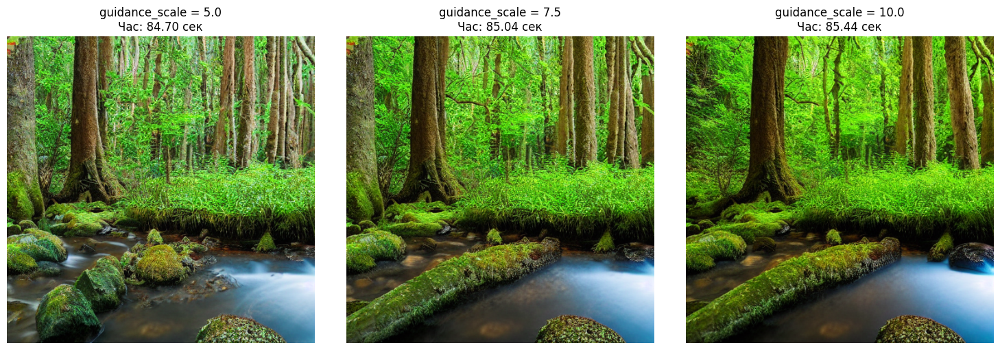

In [14]:
# Експеримент з різними значеннями guidance_scale.
guidance_values = [5.0, 7.5, 10.0]
# Використаємо детальний промпт для експерименту.
prompt_for_guidance = prompt_detailed  

plt.figure(figsize=(15, 5))

for i, gs in enumerate(guidance_values):
    # Генерація зображення з різними guidance_scale.
    image_gs, time_gs = generate_image(prompt_for_guidance, guidance_scale=gs, seed=seed_value)
    
    # Відображення.
    plt.subplot(1, 3, i+1)
    plt.imshow(np.array(image_gs))
    plt.title(f"guidance_scale = {gs}\nЧас: {time_gs:.2f} сек")
    plt.axis('off')
    
    # Збереження зображення.
    save_image(image_gs, f"forest_guidance_{gs}.png")

plt.tight_layout()
plt.show()

### Вплив кількості кроків інференсу на результат

  0%|          | 0/20 [00:00<?, ?it/s]

Зображення збережено як forest_steps_20.png


  0%|          | 0/50 [00:00<?, ?it/s]

Зображення збережено як forest_steps_50.png


  0%|          | 0/100 [00:00<?, ?it/s]

Зображення збережено як forest_steps_100.png


  0%|          | 0/200 [00:00<?, ?it/s]

Зображення збережено як forest_steps_200.png


  0%|          | 0/500 [00:00<?, ?it/s]

Зображення збережено як forest_steps_500.png


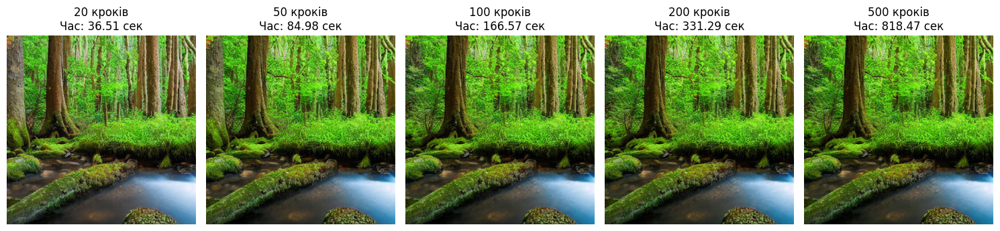

In [15]:
# Експеримент з різною кількістю кроків.
step_values = [20, 50, 100, 200, 500]
# Використаємо детальний промпт для експерименту.
prompt_for_steps = prompt_detailed  

plt.figure(figsize=(15, 5))

for i, steps in enumerate(step_values):
    # Генерація зображення з різною кількістю кроків.
    image_steps, time_steps = generate_image(prompt_for_steps, num_inference_steps=steps, seed=seed_value)
    
    # Відображення.
    plt.subplot(1, 5, i+1)
    plt.imshow(np.array(image_steps))
    plt.title(f"{steps} кроків\nЧас: {time_steps:.2f} сек")
    plt.axis('off')
    
    # Збереження зображення.
    save_image(image_steps, f"forest_steps_{steps}.png")

plt.tight_layout()
plt.show()

### Інші експерименти (з різними промтами та кількістю кроків)

Промпт: Forest nymph in a woodland temple, surrounded by fireflies, sunbeams filtering through tree canopy, magical atmosphere, detailed rendering, studio lighting, hyperrealism


  0%|          | 0/200 [00:00<?, ?it/s]

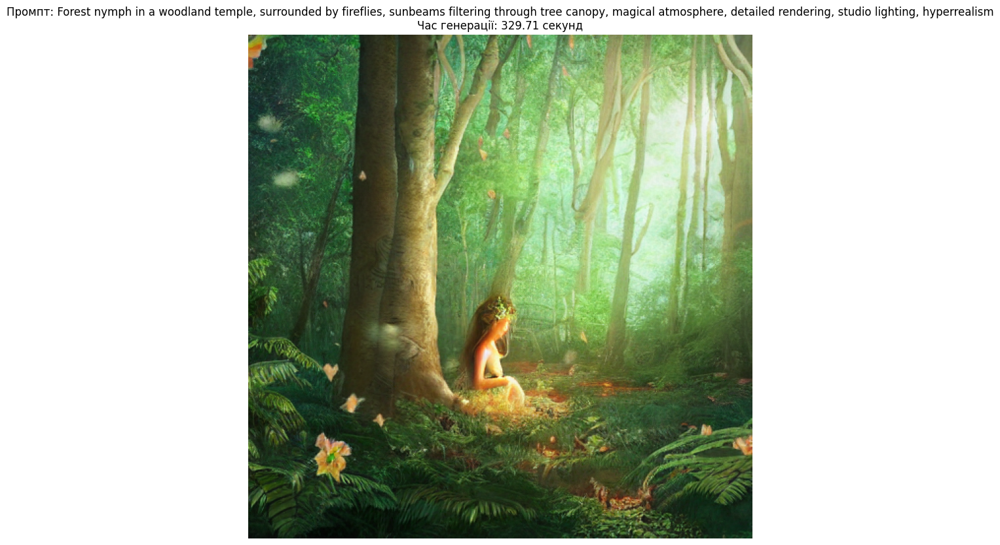

Зображення збережено як another_promt1.png


In [16]:
# Промт розширений з зібльшеною кількістю кроків.
another_promt1 = "Forest nymph in a woodland temple, surrounded by fireflies, sunbeams filtering through tree canopy, magical atmosphere, detailed rendering, studio lighting, hyperrealism"

print(f"Промпт: {another_promt1}")
another_promt1_image, another_promt1_time = generate_image(another_promt1, seed=seed_value, num_inference_steps=200)
display_image_with_info(another_promt1_image, another_promt1, another_promt1_time)
save_image(another_promt1_image, "another_promt1.png")

Промпт: Surrealistic dessert city, buildings made of chocolate, caramel roads, fruit syrup rain, miniature marshmallow inhabitants, macro photography, depth of field, detailed


  0%|          | 0/200 [00:00<?, ?it/s]

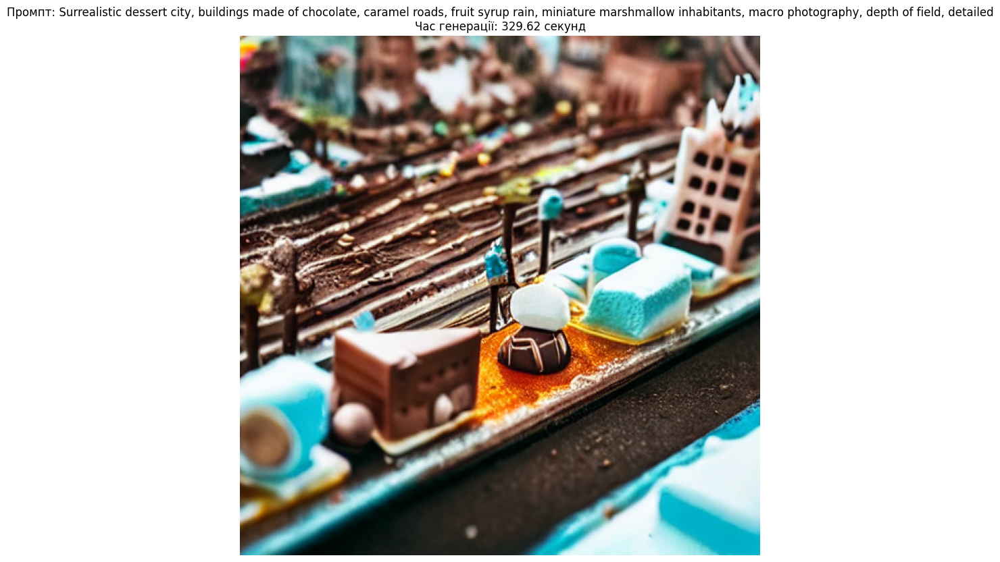

Зображення збережено як another_promt2.png


In [17]:
# Промт на деталізацію.
another_promt2 = "Surrealistic dessert city, buildings made of chocolate, caramel roads, fruit syrup rain, miniature marshmallow inhabitants, macro photography, depth of field, detailed"

print(f"Промпт: {another_promt2}")
another_promt2_image, another_promt2_time = generate_image(another_promt2, seed=seed_value, num_ inference_steps=200)
display_image_with_info(another_promt2_image, another_promt2, another_promt2_time)
save_image(another_promt2_image, "another_promt2.png")

Промпт: Ukrainian Cossack tea ceremony, Zaporozhian Cossacks in traditional attire performing Japanese tea ceremony, detailed costumes, authentic tea utensils, soft natural lighting, photorealistic


  0%|          | 0/500 [00:00<?, ?it/s]

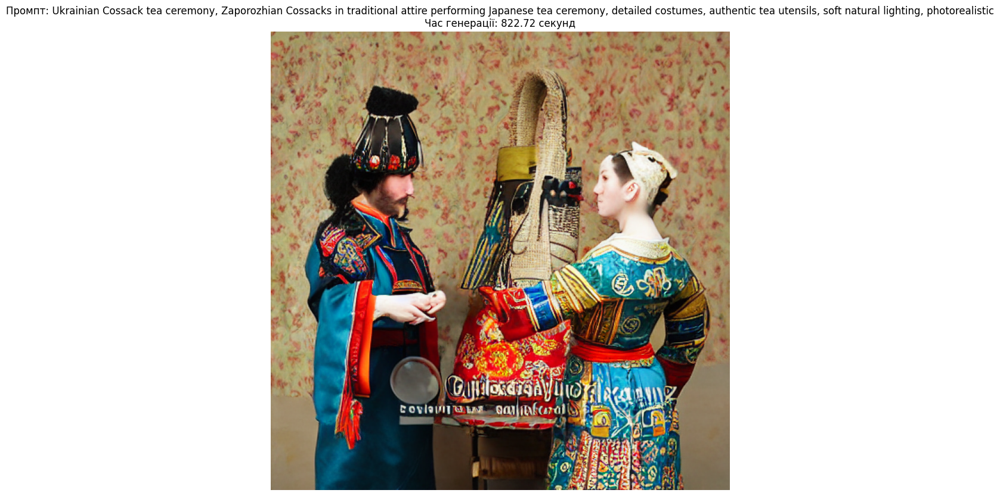

Зображення збережено як another_promt3.png


In [18]:
# Генерація людей.
another_promt3 = "Ukrainian Cossack tea ceremony, Zaporozhian Cossacks in traditional attire performing Japanese tea ceremony, detailed costumes, authentic tea utensils, soft natural lighting, photorealistic"

print(f"Промпт: {another_promt3}")
another_promt3_image, another_promt3_time = generate_image(another_promt3, seed=seed_value, num_inference_steps=500)
display_image_with_info(another_promt3_image, another_promt3, another_promt3_time)
save_image(another_promt3_image, "another_promt3.png")

Промпт: Cyborg plant, semi-mechanical fern with integrated microchips and LEDs growing from technological soil, sci-fi style, fine details, neon lighting, 4K, HDR, highly detailed, cinematic lighting


  0%|          | 0/500 [00:00<?, ?it/s]

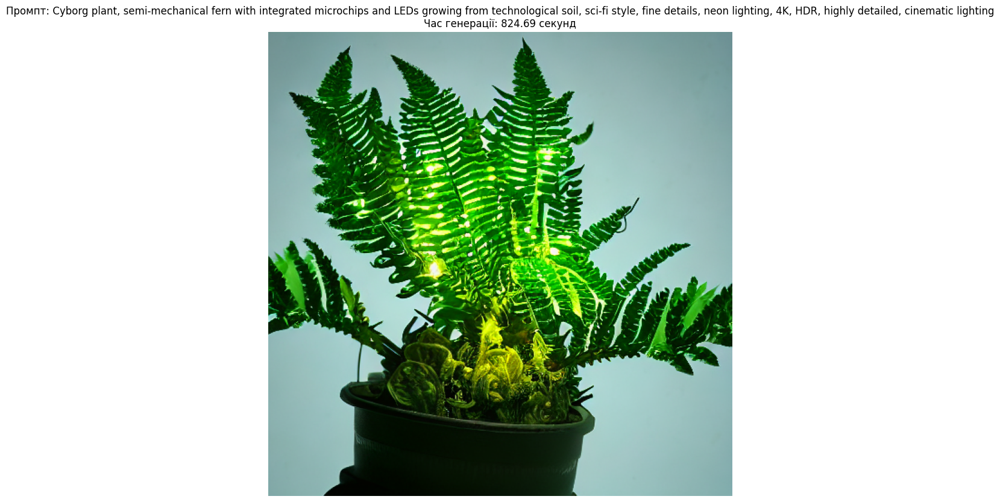

Зображення збережено як another_promt4.png


In [19]:
# Щось сучасне, побільше якості.

another_promt4 = "Cyborg plant, semi-mechanical fern with integrated microchips and LEDs growing from technological soil, sci-fi style, fine details, neon lighting, 4K, HDR, highly detailed, cinematic lighting"

print(f"Промпт: {another_promt4}")
another_promt4_image, another_promt4_time = generate_image(another_promt4, seed=seed_value, num_inference_steps=500)
display_image_with_info(another_promt4_image, another_promt4, another_promt4_time)
save_image(another_promt4_image, "another_promt4.png")

In [ ]:
# Архітектура.

another_promt5 = "A breathtaking aurora borealis illuminating an ancient, half-submerged temple complex in a crystalline arctic lake, with twisted spires of polished obsidian reaching skyward. The temple is partly Angkor Wat-inspired but with biomechanical elements seamlessly integrated into the stonework."

print(f"Промпт: {another_promt5}")
another_promt5_image, another_promt5_time = generate_image(another_promt5, seed=seed_value, num_inference_steps=100)
display_image_with_info(another_promt5_image, another_promt5, another_promt5_time)
save_image(another_promt5_image, "another_promt5.png")

Промпт: A breathtaking aurora borealis illuminating an ancient, half-submerged temple complex in a crystalline arctic lake, with twisted spires of polished obsidian reaching skyward. The temple is partly Angkor Wat-inspired but with biomechanical elements seamlessly integrated into the stonework.


  0%|          | 0/100 [00:00<?, ?it/s]

## Висновки з додаткових експериментів

### Вплив параметра guidance_scale

Параметр `guidance_scale` контролює, наскільки строго модель повинна слідувати текстовому промпту:

- **Низьке значення (5.0)**: Модель має більше свободи для інтерпретації, що може призвести до більш творчих, але менш точних результатів.
- **Середнє значення (7.5)**: Збалансований підхід, який зазвичай дає найкращі результати для більшості запитів.
- **Високе значення (10.0)**: Модель суворіше дотримується промпту, що може покращити відповідність, але іноді призводить до менш естетичних зображень або більшої кількості артефактів.

### Вплив кількості кроків інференсу

Параметр `num_inference_steps` визначає кількість кроків, які модель використовує для поступового видалення шуму:

- **Мало кроків (20)**: Швидша генерація, але нижча якість зображення та більша ймовірність артефактів.
- **Середня кількість кроків (50)**: Хороший компроміс між якістю та швидкістю для більшості застосувань.
- **Багато кроків (100)**: Найвища якість зображення з меншою кількістю артефактів, але значно довший час генерації.
- **Дуже багато кроків (200)**: якість зображення зовсім трошки краще аніж на 100 кроків, при цьому час генерації збільшується х2.
- **Максимум кроків (500)**: при використання більше як 500 кроків є можливість отримати просто чорний квадрат, така кількість кроків можливо і дає дещо кращий результат, але він не оправдовує час генерації.

Ці експерименти підтверджують, що параметри генерації зображень мають значний вплив на результат і повинні бути адаптовані відповідно до конкретних вимог завдання: якщо важлива швидкість, можна зменшити кількість кроків; якщо критична якість, варто збільшити кількість кроків та підібрати оптимальне значення guidance_scale.

## Загальні висновки про Diffusion Models

На основі проведених експериментів можна зробити наступні висновки про Diffusion Models:

1. **Переваги над GANs підтверджуються на практиці**:
   - Висока деталізація зображень, особливо при складних запитах
   - Хороша відповідність текстовим промптам
   - Менша кількість артефактів порівняно з типовими результатами GANs
   - Здатність інтерпретувати абстрактні концепції

2. **Ключові фактори якості генерації**:
   - Детальність і структурованість промпту
   - Правильний вибір параметрів генерації
   - Баланс між конкретністю та простором для інтерпретації

3. **Практичні рекомендації**:
   - Для простих запитів достатньо короткого опису і меншої кількості кроків
   - Для складних фантастичних сцен варто використовувати детальні промпти, більше кроків інференсу та оптимальний guidance_scale
   - При важливості часу генерації можна знизити кількість кроків до 50-100 без значної втрати якості

4. **Обмеження**:
   - Час генерації значно більший порівняно з GANs
   - Складні деталі (як-от людські обличчя) все ще можуть мати артефакти
   - Висока вимогливість до обчислювальних ресурсів

Diffusion Models, особливо Stable Diffusion, демонструють вражаючі можливості для творчої генерації зображень та мають значний потенціал у різних галузях застосування, від ігор та розваг до дизайну та мистецтва.